<a href="https://colab.research.google.com/github/Manish2585/pulses-image-classification/blob/main/Pulses_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [23]:
import os

print(os.listdir("/content/drive/MyDrive"))

['Colab Notebooks', 'pulses_image_classification']


In [24]:
PROJECT_DIR = "/content/drive/MyDrive/pulses_image_classification"

print(os.listdir(PROJECT_DIR))

['An Image Dataset of Seven Major Pulses Grown in Ba.zip']


In [25]:
from pathlib import Path

PROJECT_DIR = Path(
    "/content/drive/MyDrive/pulses_image_classification"
)

zip_files = list(PROJECT_DIR.glob("*.zip"))

print("ZIP files found:")

for zip_file in zip_files:
    size_mb = zip_file.stat().st_size / (1024 * 1024)
    print(f"{zip_file.name} - {size_mb:.2f} MB")

ZIP files found:
An Image Dataset of Seven Major Pulses Grown in Ba.zip - 170.52 MB


In [26]:
import zipfile

zip_path = zip_files[0]

DATA_DIR = PROJECT_DIR / "dataset"

DATA_DIR.mkdir(parents=True, exist_ok=True)

print("Extracting dataset...")
print("From:", zip_path)
print("To:", DATA_DIR)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(DATA_DIR)

print("\nExtraction completed!")

Extracting dataset...
From: /content/drive/MyDrive/pulses_image_classification/An Image Dataset of Seven Major Pulses Grown in Ba.zip
To: /content/drive/MyDrive/pulses_image_classification/dataset

Extraction completed!


In [27]:
image_extensions = {
    ".jpg", ".jpeg", ".png", ".bmp", ".webp"
}

image_files = [
    p
    for p in DATA_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in image_extensions
]

print("Total images:", len(image_files))

print("\nFirst 10 images:")

for p in image_files[:10]:
    print(p)

Total images: 2956

First 10 images:
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_007.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_008.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_010.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_004.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_002.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_012.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/ancho

In [11]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [12]:
!pip install -q torch torchvision torchaudio
!pip install -q numpy pandas matplotlib seaborn scikit-learn pillow tqdm

In [13]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

from torch.utils.data import Dataset, DataLoader

In [28]:
from google.colab import drive
from pathlib import Path

# Mount Google Drive
drive.mount("/content/drive")

# Persistent project directory
BASE_DIR = "/content/drive/MyDrive/pulses-image-classification"

# Create project folders
Path(BASE_DIR).mkdir(parents=True, exist_ok=True)
Path(f"{BASE_DIR}/data").mkdir(parents=True, exist_ok=True)
Path(f"{BASE_DIR}/models").mkdir(parents=True, exist_ok=True)
Path(f"{BASE_DIR}/results").mkdir(parents=True, exist_ok=True)

print("Project directory created:")
print(BASE_DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Project directory created:
/content/drive/MyDrive/pulses-image-classification


In [15]:
import os

for filename in os.listdir("/content"):
    print(filename)

.config
pulses-image-classification
sample_data


In [ ]:
!pip install -q kaggle

In [29]:
import os

print(os.listdir("/content"))

['.config', 'drive', 'pulses-image-classification', 'sample_data']


In [30]:
zip_path = os.path.join("/content", zip_files[0])
extract_path = "/content/pulses_dataset"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(extract_path)

print(" Dataset extracted successfully!")

 Dataset extracted successfully!


In [31]:
import os

for root, dirs, files in os.walk("/content/pulses_dataset"):
    level = root.replace("/content/pulses_dataset", "").count(os.sep)
    indent = "    " * level
    print(f"{indent}{os.path.basename(root)}/")

    if level >= 2:
        continue

    for file in files[:5]:
        print(f"{indent}    {file}")

pulses_dataset/
    An Image Dataset of Seven Major Pulses Grown in Ba/
        Pulses/
            Split Black Gram/
            Anchor/
            Kidney Bean/
            Hyacinth Bean/
            Yellow Split Pea/
            Horse Gram/
            Split and Husked Green Gram/
            Grass Pea/
            Black Gram/
            White Pea/
            Red Lentils/
            Unpolished Grass Pea/
            Green Gram/
            Unpolished Chickpea/
            Pigeon Pea/
            Polished Chickpea/
            examples/


In [32]:
from pathlib import Path

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}

image_files = []

for path in Path(DATA_DIR).rglob("*"):
    if path.suffix.lower() in image_extensions:
        image_files.append(path)

print("Total image files:", len(image_files))

print("\nFirst 10 images:")
for path in image_files[:10]:
    print(path)

Total image files: 2956

First 10 images:
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_007.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_008.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_010.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_004.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_002.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/anchor_012.jpg
/content/drive/MyDrive/pulses_image_classification/dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Anchor/

In [33]:
import os

print("Files/folders directly under /content:\n")

for item in os.listdir("/content"):
    path = os.path.join("/content", item)

    if os.path.isdir(path):
        print(f"[DIR]  {item}")
    else:
        size_mb = os.path.getsize(path) / (1024 * 1024)
        print(f"[FILE] {item}  ({size_mb:.2f} MB)")

Files/folders directly under /content:

[DIR]  .config
[DIR]  drive
[DIR]  pulses_dataset
[DIR]  pulses-image-classification
[DIR]  sample_data


In [34]:
from pathlib import Path

DATA_DIR = Path("/content/pulses_dataset")

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}

image_files = [
    p for p in DATA_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in image_extensions
]

print("Dataset directory:", DATA_DIR)
print("Total image files:", len(image_files))

print("\nFirst 20 images:")
for p in image_files[:20]:
    print(p)

Dataset directory: /content/pulses_dataset
Total image files: 2956

First 20 images:
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_074.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_143.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_106.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_050.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_112.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_137.jpg
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Split Black Gram/split_black_gram_114.jpg
/content/pulses_dataset/An Image Dataset of Sev

In [35]:
import os

print("Dataset structure:\n")

for root, dirs, files in os.walk("/content/pulses_dataset"):
    level = root.replace("/content/pulses_dataset", "").count(os.sep)

    # Don't print an enormous tree
    if level <= 3:
        indent = "    " * level
        print(f"{indent}{os.path.basename(root)}/")

        for file in files[:5]:
            print(f"{indent}    {file}")

Dataset structure:

pulses_dataset/
    An Image Dataset of Seven Major Pulses Grown in Ba/
        Pulses/
            pulses_metadata.csv
            Split Black Gram/
                split_black_gram_074.jpg
                split_black_gram_143.jpg
                split_black_gram_106.jpg
                split_black_gram_050.jpg
                split_black_gram_112.jpg
            Anchor/
                anchor_124.jpg
                anchor_155.jpg
                anchor_022.jpg
                anchor_018.jpg
                anchor_109.jpg
            Kidney Bean/
                kidney_bean_125.jpg
                kidney_bean_089.jpg
                kidney_bean_012.jpg
                kidney_bean_010.jpg
                kidney_bean_085.jpg
            Hyacinth Bean/
                hyacinth_bean_194.jpg
                hyacinth_bean_123.jpg
                hyacinth_bean_071.jpg
                hyacinth_bean_091.jpg
                hyacinth_bean_046.jpg
            Yellow Split Pea

In [36]:
from collections import Counter

class_counts = Counter()

for image_path in image_files:
    class_name = image_path.parent.name
    class_counts[class_name] += 1

print("Number of detected classes:", len(class_counts))
print()

for class_name, count in sorted(class_counts.items()):
    print(f"{class_name:45s} {count}")

Number of detected classes: 16

Anchor                                        196
Black Gram                                    197
Grass Pea                                     198
Green Gram                                    163
Horse Gram                                    199
Hyacinth Bean                                 198
Kidney Bean                                   186
Pigeon Pea                                    173
Polished Chickpea                             164
Red Lentils                                   189
Split Black Gram                              195
Split and Husked Green Gram                   178
Unpolished Chickpea                           182
Unpolished Grass Pea                          160
White Pea                                     188
Yellow Split Pea                              190


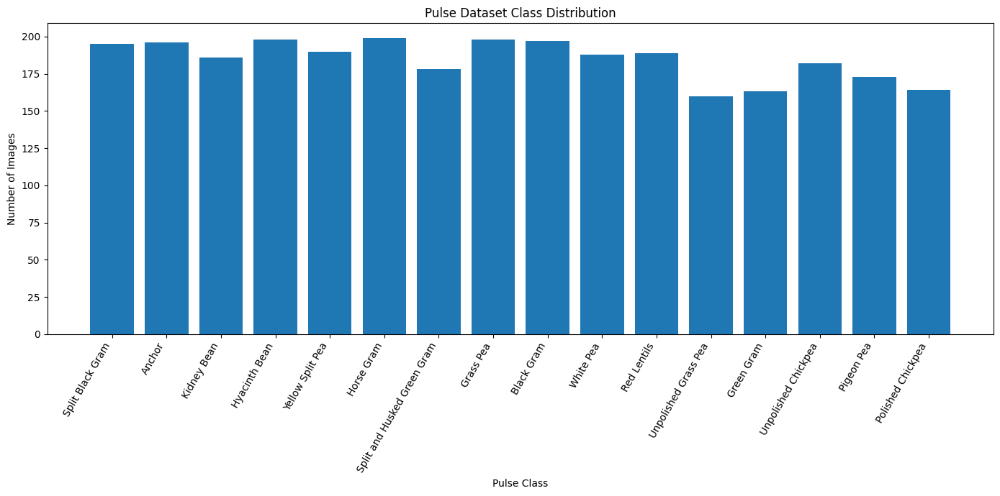

In [37]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))

classes = list(class_counts.keys())
counts = list(class_counts.values())

plt.bar(classes, counts)

plt.xlabel("Pulse Class")
plt.ylabel("Number of Images")
plt.title("Pulse Dataset Class Distribution")

plt.xticks(rotation=60, ha="right")
plt.tight_layout()
plt.show()

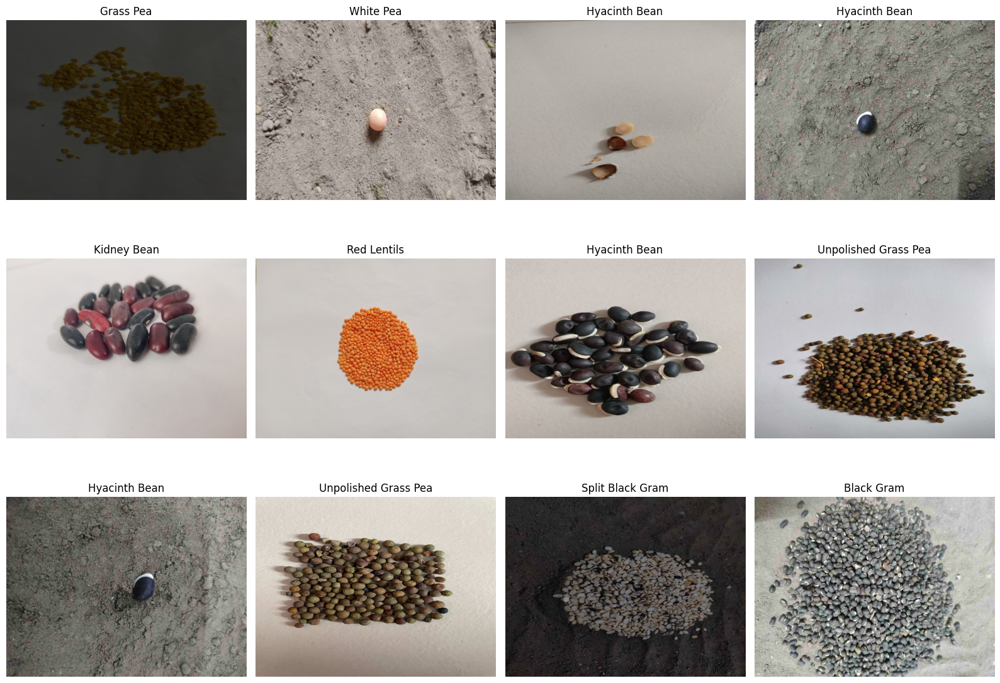

In [38]:
import random
import matplotlib.pyplot as plt
from PIL import Image

num_samples = min(12, len(image_files))

sample_images = random.sample(image_files, num_samples)

plt.figure(figsize=(16, 12))

for i, image_path in enumerate(sample_images):

    try:
        image = Image.open(image_path).convert("RGB")

        plt.subplot(3, 4, i + 1)
        plt.imshow(image)
        plt.title(image_path.parent.name)
        plt.axis("off")

    except Exception as e:
        print("Error:", image_path, e)

plt.tight_layout()
plt.show()

In [39]:
from collections import Counter
from PIL import Image

sizes = Counter()

for image_path in image_files[:2000]:

    try:
        with Image.open(image_path) as img:
            sizes[img.size] += 1

    except Exception:
        pass

print("Most common image dimensions:\n")

for size, count in sizes.most_common(15):
    print(f"{size}: {count}")

Most common image dimensions:

(1024, 768): 2000


In [40]:
corrupted_images = []

for image_path in image_files:

    try:
        with Image.open(image_path) as img:
            img.verify()

    except Exception:
        corrupted_images.append(image_path)

print("Total images:", len(image_files))
print("Corrupted images:", len(corrupted_images))

if corrupted_images:
    print("\nFirst corrupted files:")

    for path in corrupted_images[:20]:
        print(path)

Total images: 2956
Corrupted images: 0


In [41]:
import pandas as pd

data = []

for image_path in image_files:
    data.append({
        "image_path": str(image_path),
        "class_name": image_path.parent.name
    })

df = pd.DataFrame(data)

print("Dataset shape:", df.shape)

print("\nFirst 10 rows:")
display(df.head(10))

print("\nClass distribution:")
display(
    df["class_name"]
    .value_counts()
    .sort_index()
)

Dataset shape: (2956, 2)

First 10 rows:


,image_path,class_name
0,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
1,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
2,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
3,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
4,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
5,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
6,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
7,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
8,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
9,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram



Class distribution:


,count
class_name,
Anchor,196
Black Gram,197
Grass Pea,198
Green Gram,163
Horse Gram,199
Hyacinth Bean,198
Kidney Bean,186
Pigeon Pea,173
Polished Chickpea,164


In [42]:
print("All image dimensions:\n")

for size, count in sizes.most_common():
    print(f"{size}: {count}")

All image dimensions:

(1024, 768): 2000


In [43]:
import pandas as pd

data = []

for image_path in image_files:
    data.append({
        "image_path": str(image_path),
        "class_name": image_path.parent.name
    })

df = pd.DataFrame(data)

print("Dataset shape:", df.shape)

print("\nFirst 10 rows:")
display(df.head(10))

print("\nClass distribution:")
display(
    df["class_name"]
    .value_counts()
    .sort_index()
)

Dataset shape: (2956, 2)

First 10 rows:


,image_path,class_name
0,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
1,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
2,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
3,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
4,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
5,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
6,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
7,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
8,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram
9,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram



Class distribution:


,count
class_name,
Anchor,196
Black Gram,197
Grass Pea,198
Green Gram,163
Horse Gram,199
Hyacinth Bean,198
Kidney Bean,186
Pigeon Pea,173
Polished Chickpea,164


In [44]:
class_distribution = (
    df["class_name"]
    .value_counts()
    .sort_index()
)

print(class_distribution)

print("\nTotal:", class_distribution.sum())
print("Number of classes:", len(class_distribution))

class_name
Anchor                         196
Black Gram                     197
Grass Pea                      198
Green Gram                     163
Horse Gram                     199
Hyacinth Bean                  198
Kidney Bean                    186
Pigeon Pea                     173
Polished Chickpea              164
Red Lentils                    189
Split Black Gram               195
Split and Husked Green Gram    178
Unpolished Chickpea            182
Unpolished Grass Pea           160
White Pea                      188
Yellow Split Pea               190
Name: count, dtype: int64

Total: 2956
Number of classes: 16


In [45]:
classes = sorted(df["class_name"].unique())

class_to_idx = {
    class_name: idx
    for idx, class_name in enumerate(classes)
}

idx_to_class = {
    idx: class_name
    for class_name, idx in class_to_idx.items()
}

print("Class → Index")
print("-" * 40)

for class_name, idx in class_to_idx.items():
    print(f"{idx:2d} → {class_name}")

Class → Index
----------------------------------------
 0 → Anchor
 1 → Black Gram
 2 → Grass Pea
 3 → Green Gram
 4 → Horse Gram
 5 → Hyacinth Bean
 6 → Kidney Bean
 7 → Pigeon Pea
 8 → Polished Chickpea
 9 → Red Lentils
10 → Split Black Gram
11 → Split and Husked Green Gram
12 → Unpolished Chickpea
13 → Unpolished Grass Pea
14 → White Pea
15 → Yellow Split Pea


In [47]:
df["label"] = df["class_name"].map(class_to_idx)

display(df.head())

,image_path,class_name,label
0,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram,10
1,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram,10
2,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram,10
3,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram,10
4,/content/pulses_dataset/An Image Dataset of Se...,Split Black Gram,10


In [49]:
from sklearn.model_selection import train_test_split

In [50]:
train_df, temp_df = train_test_split(
    df,
    test_size=0.30,
    stratify=df["label"],
    random_state=42
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    stratify=temp_df["label"],
    random_state=42
)

In [51]:
print("Train:", len(train_df))
print("Validation:", len(val_df))
print("Test:", len(test_df))
print("Total:", len(train_df) + len(val_df) + len(test_df))

Train: 2069
Validation: 443
Test: 444
Total: 2956


In [52]:
split_distribution = pd.DataFrame({
    "Total": df["class_name"].value_counts(),
    "Train": train_df["class_name"].value_counts(),
    "Validation": val_df["class_name"].value_counts(),
    "Test": test_df["class_name"].value_counts()
}).fillna(0).astype(int)

display(split_distribution.sort_index())

,Total,Train,Validation,Test
class_name,,,,
Anchor,196,137,29,30
Black Gram,197,138,29,30
Grass Pea,198,139,29,30
Green Gram,163,114,25,24
Horse Gram,199,139,30,30
Hyacinth Bean,198,139,29,30
Kidney Bean,186,130,28,28
Pigeon Pea,173,121,26,26
Polished Chickpea,164,115,25,24


In [53]:
train_paths = set(train_df["image_path"])
val_paths = set(val_df["image_path"])
test_paths = set(test_df["image_path"])

print("Train ∩ Validation:", len(train_paths & val_paths))
print("Train ∩ Test:", len(train_paths & test_paths))
print("Validation ∩ Test:", len(val_paths & test_paths))

Train ∩ Validation: 0
Train ∩ Test: 0
Validation ∩ Test: 0


In [54]:
SPLIT_DIR = "/content/pulses-image-classification/data"

train_df.to_csv(f"{SPLIT_DIR}/train.csv", index=False)
val_df.to_csv(f"{SPLIT_DIR}/validation.csv", index=False)
test_df.to_csv(f"{SPLIT_DIR}/test.csv", index=False)

print("Dataset splits saved.")

Dataset splits saved.


In [55]:
import torchvision.transforms as transforms

In [56]:
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.RandomHorizontalFlip(p=0.5),

    transforms.RandomRotation(degrees=15),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [57]:
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [58]:
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [59]:
from torch.utils.data import Dataset
from PIL import Image

class PulsesDataset(Dataset):

    def __init__(self, dataframe, transform=None):

        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):

        image_path = self.dataframe.loc[index, "image_path"]
        label = self.dataframe.loc[index, "label"]

        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

In [60]:
print("df exists:", "df" in globals())
print("train_df exists:", "train_df" in globals())
print("val_df exists:", "val_df" in globals())
print("test_df exists:", "test_df" in globals())

df exists: True
train_df exists: True
val_df exists: True
test_df exists: True


In [61]:
import os

print("Contents of /content:\n")

for item in os.listdir("/content"):
    print(item)

Contents of /content:

.config
drive
pulses_dataset
pulses-image-classification
sample_data


In [62]:
import os

dataset_path = "/content/pulses_dataset"

print("Dataset exists:", os.path.exists(dataset_path))

if os.path.exists(dataset_path):
    print("Dataset is still available.")
    print("\nContents:")
    for item in os.listdir(dataset_path):
        print(item)
else:
    print("Dataset is NOT available.")

Dataset exists: True
Dataset is still available.

Contents:
An Image Dataset of Seven Major Pulses Grown in Ba


In [63]:
split_distribution = pd.DataFrame({
    "Total": df["class_name"].value_counts(),
    "Train": train_df["class_name"].value_counts(),
    "Validation": val_df["class_name"].value_counts(),
    "Test": test_df["class_name"].value_counts()
}).fillna(0).astype(int)

display(split_distribution.sort_index())

,Total,Train,Validation,Test
class_name,,,,
Anchor,196,137,29,30
Black Gram,197,138,29,30
Grass Pea,198,139,29,30
Green Gram,163,114,25,24
Horse Gram,199,139,30,30
Hyacinth Bean,198,139,29,30
Kidney Bean,186,130,28,28
Pigeon Pea,173,121,26,26
Polished Chickpea,164,115,25,24


In [64]:
train_dataset = PulsesDataset(
    train_df,
    transform=train_transform
)

val_dataset = PulsesDataset(
    val_df,
    transform=val_transform
)

test_dataset = PulsesDataset(
    test_df,
    transform=test_transform
)

print("Training samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))
print("Test samples:", len(test_dataset))

Training samples: 2069
Validation samples: 443
Test samples: 444


In [65]:
image, label = train_dataset[0]

print("Image shape:", image.shape)
print("Label:", label)
print("Class:", idx_to_class[label])

Image shape: torch.Size([3, 224, 224])
Label: 5
Class: Hyacinth Bean


In [66]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("DataLoaders created successfully.")

DataLoaders created successfully.


In [67]:
images, labels = next(iter(train_loader))

print("Batch image shape:", images.shape)
print("Batch labels shape:", labels.shape)

print("First 10 labels:", labels[:10])

Batch image shape: torch.Size([32, 3, 224, 224])
Batch labels shape: torch.Size([32])
First 10 labels: tensor([ 9, 14,  5, 12,  9,  5, 10,  4, 11,  8])


In [68]:
images, labels = next(iter(val_loader))

print("Validation batch image shape:", images.shape)
print("Validation batch labels shape:", labels.shape)

Validation batch image shape: torch.Size([32, 3, 224, 224])
Validation batch labels shape: torch.Size([32])


In [69]:
images, labels = next(iter(test_loader))

print("Test batch image shape:", images.shape)
print("Test batch labels shape:", labels.shape)

Test batch image shape: torch.Size([32, 3, 224, 224])
Test batch labels shape: torch.Size([32])


In [70]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights

In [71]:
weights = EfficientNet_B0_Weights.DEFAULT

model = efficientnet_b0(weights=weights)

print(model)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 167MB/s]

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [72]:
num_features = model.classifier[1].in_features

print("Classifier input features:", num_features)

Classifier input features: 1280


In [77]:
num_classes = len(classes)

model.classifier[1] = nn.Linear(
    num_features,
    num_classes
)

print(model.classifier)


Sequential(
  (0): Dropout(p=0.2, inplace=True)
  (1): Linear(in_features=1280, out_features=16, bias=True)
)


In [78]:
import torch

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", device)

PyTorch version: 2.11.0+cu128
CUDA available: True
Device: cuda


In [79]:
print(type(model))

<class 'torchvision.models.efficientnet.EfficientNet'>


In [80]:
model = model.to(device)

print("Model successfully moved to:", device)

Model successfully moved to: cuda


In [81]:
output = model(images.to(device))

In [82]:
images, labels = next(iter(train_loader))

images = images.to(device)

with torch.no_grad():
    outputs = model(images)

print("Output shape:", outputs.shape)

Output shape: torch.Size([32, 16])


In [83]:
criterion = nn.CrossEntropyLoss()

In [84]:
optimizer = optim.Adam(
    model.parameters(),
    lr=0.0001
)

In [85]:
total_params = sum(
    p.numel()
    for p in model.parameters()
)

trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print("Total parameters:", total_params)
print("Trainable parameters:", trainable_params)

Total parameters: 4028044
Trainable parameters: 4028044


In [90]:
NUM_EPOCHS = 10

In [86]:
def train_one_epoch(model, loader, criterion, optimizer, device):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(device)
        labels = labels.to(device)

        # Clear previous gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Calculate loss
        loss = criterion(outputs, labels)

        # Backward pass
        loss.backward()

        # Update weights
        optimizer.step()

        # Statistics
        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)

        correct += (
            predicted == labels
        ).sum().item()

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [87]:
def validate(model, loader, criterion, device):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)

            correct += (
                predicted == labels
            ).sum().item()

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [88]:
train_losses = []
train_accuracies = []

val_losses = []
val_accuracies = []

In [92]:
from pathlib import Path

BASE_DIR = Path(
    "/content/drive/MyDrive/pulses-image-classification"
)

MODEL_DIR = BASE_DIR / "models"
MODEL_DIR.mkdir(parents=True, exist_ok=True)

best_model_path = MODEL_DIR / "best_model.pth"

print("Best model will be saved at:")
print(best_model_path)

Best model will be saved at:
/content/drive/MyDrive/pulses-image-classification/models/best_model.pth


In [93]:
best_val_accuracy = 0.0
best_model_path = BASE_DIR / "models" / "best_model.pth"

for epoch in range(NUM_EPOCHS):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    val_loss, val_acc = validate(
        model,
        val_loader,
        criterion,
        device
    )

    train_losses.append(train_loss)
    train_accuracies.append(train_acc)

    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    print(
        f"Epoch [{epoch+1}/{NUM_EPOCHS}] "
        f"Train Loss: {train_loss:.4f} "
        f"Train Acc: {train_acc:.4f} "
        f"Val Loss: {val_loss:.4f} "
        f"Val Acc: {val_acc:.4f}"
    )

    # Save best model
    if val_acc > best_val_accuracy:

        best_val_accuracy = val_acc

        torch.save(
            model.state_dict(),
            best_model_path
        )

        print("  ✓ Best model saved")

Epoch [1/10] Train Loss: 2.1821 Train Acc: 0.4717 Val Loss: 1.3269 Val Acc: 0.7720
  ✓ Best model saved
Epoch [2/10] Train Loss: 1.0641 Train Acc: 0.8033 Val Loss: 0.4989 Val Acc: 0.8962
  ✓ Best model saved
Epoch [3/10] Train Loss: 0.4743 Train Acc: 0.9087 Val Loss: 0.2148 Val Acc: 0.9549
  ✓ Best model saved
Epoch [4/10] Train Loss: 0.2562 Train Acc: 0.9478 Val Loss: 0.1272 Val Acc: 0.9684
  ✓ Best model saved
Epoch [5/10] Train Loss: 0.1543 Train Acc: 0.9705 Val Loss: 0.0787 Val Acc: 0.9842
  ✓ Best model saved
Epoch [6/10] Train Loss: 0.0945 Train Acc: 0.9826 Val Loss: 0.0544 Val Acc: 0.9842
Epoch [7/10] Train Loss: 0.0779 Train Acc: 0.9841 Val Loss: 0.0516 Val Acc: 0.9819
Epoch [8/10] Train Loss: 0.0620 Train Acc: 0.9899 Val Loss: 0.0398 Val Acc: 0.9865
  ✓ Best model saved
Epoch [9/10] Train Loss: 0.0392 Train Acc: 0.9937 Val Loss: 0.0341 Val Acc: 0.9910
  ✓ Best model saved
Epoch [10/10] Train Loss: 0.0380 Train Acc: 0.9923 Val Loss: 0.0403 Val Acc: 0.9865


In [94]:
import torch

model.load_state_dict(
    torch.load(
        best_model_path,
        map_location=device
    )
)

model = model.to(device)

print("Best model loaded successfully.")
print("Best validation accuracy:", best_val_accuracy)

Best model loaded successfully.
Best validation accuracy: 0.9909706546275395


In [95]:
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

model.eval()

all_predictions = []
all_labels = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        _, predictions = torch.max(outputs, 1)

        all_predictions.extend(
            predictions.cpu().numpy()
        )

        all_labels.extend(
            labels.cpu().numpy()
        )

print("Total predictions:", len(all_predictions))
print("Total actual labels:", len(all_labels))

Total predictions: 444
Total actual labels: 444


In [96]:
accuracy = accuracy_score(
    all_labels,
    all_predictions
)

print(f"Test Accuracy: {accuracy:.4f}")
print(f"Test Accuracy: {accuracy * 100:.2f}%")

Test Accuracy: 0.9842
Test Accuracy: 98.42%


In [97]:
precision = precision_score(
    all_labels,
    all_predictions,
    average="weighted",
    zero_division=0
)

recall = recall_score(
    all_labels,
    all_predictions,
    average="weighted",
    zero_division=0
)

f1 = f1_score(
    all_labels,
    all_predictions,
    average="weighted",
    zero_division=0
)

print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

Precision: 0.9854
Recall:    0.9842
F1-score:  0.9843


In [98]:
report = classification_report(
    all_labels,
    all_predictions,
    target_names=classes,
    zero_division=0
)

print(report)

                             precision    recall  f1-score   support

                     Anchor       1.00      1.00      1.00        30
                 Black Gram       1.00      1.00      1.00        30
                  Grass Pea       0.97      1.00      0.98        30
                 Green Gram       0.96      1.00      0.98        24
                 Horse Gram       1.00      1.00      1.00        30
              Hyacinth Bean       1.00      1.00      1.00        30
                Kidney Bean       1.00      1.00      1.00        28
                 Pigeon Pea       0.90      1.00      0.95        26
          Polished Chickpea       1.00      0.96      0.98        24
                Red Lentils       1.00      1.00      1.00        29
           Split Black Gram       1.00      1.00      1.00        30
Split and Husked Green Gram       0.93      1.00      0.96        26
        Unpolished Chickpea       1.00      0.93      0.96        27
       Unpolished Grass Pea      

In [99]:
cm = confusion_matrix(
    all_labels,
    all_predictions
)

print("Confusion matrix shape:", cm.shape)

Confusion matrix shape: (16, 16)


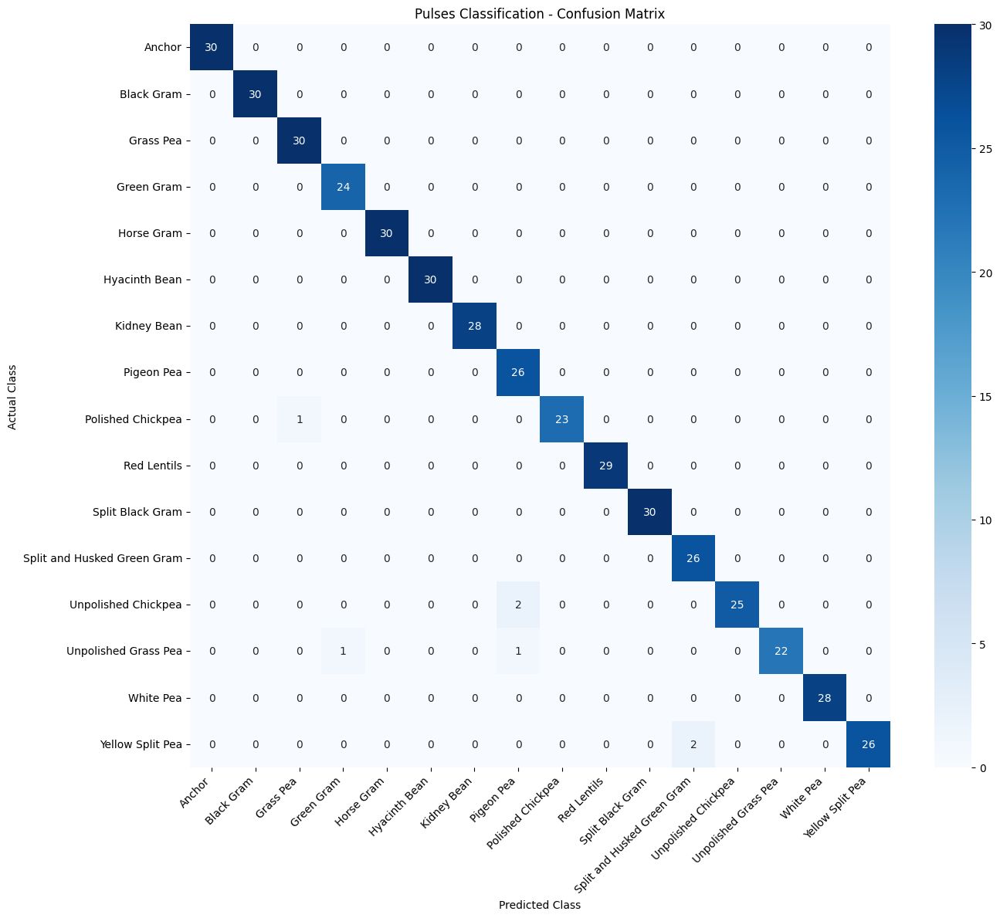

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 12))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=classes,
    yticklabels=classes
)

plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Pulses Classification - Confusion Matrix")

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()

plt.show()

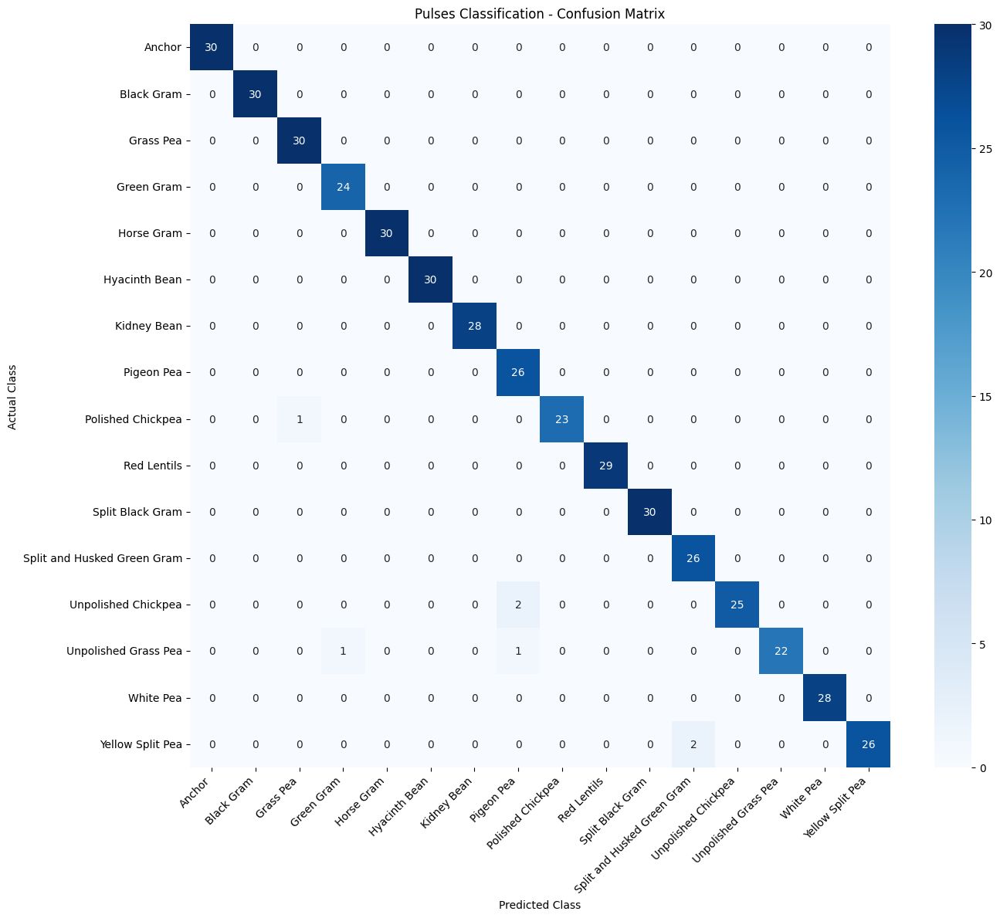

Saved: /content/drive/MyDrive/pulses-image-classification/results/confusion_matrix.png


In [101]:
RESULTS_DIR = BASE_DIR / "results"
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

plt.figure(figsize=(14, 12))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=classes,
    yticklabels=classes
)

plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.title("Pulses Classification - Confusion Matrix")

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()

cm_path = RESULTS_DIR / "confusion_matrix.png"

plt.savefig(
    cm_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Saved:", cm_path)

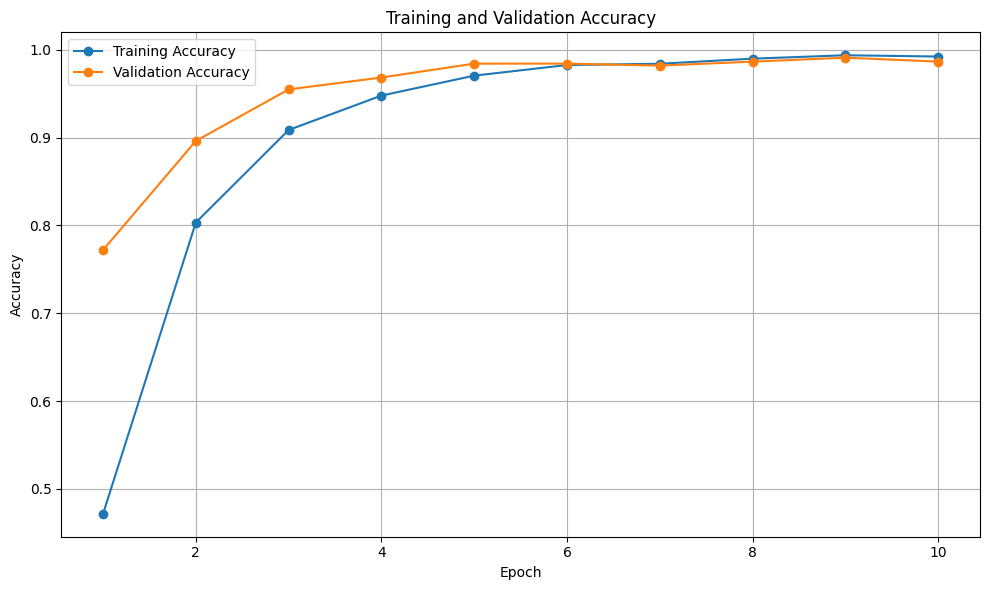

In [102]:
epochs = range(1, len(train_accuracies) + 1)

plt.figure(figsize=(10, 6))

plt.plot(
    epochs,
    train_accuracies,
    marker="o",
    label="Training Accuracy"
)

plt.plot(
    epochs,
    val_accuracies,
    marker="o",
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")

plt.legend()
plt.grid(True)

plt.tight_layout()

accuracy_curve_path = RESULTS_DIR / "accuracy_curve.png"

plt.savefig(
    accuracy_curve_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

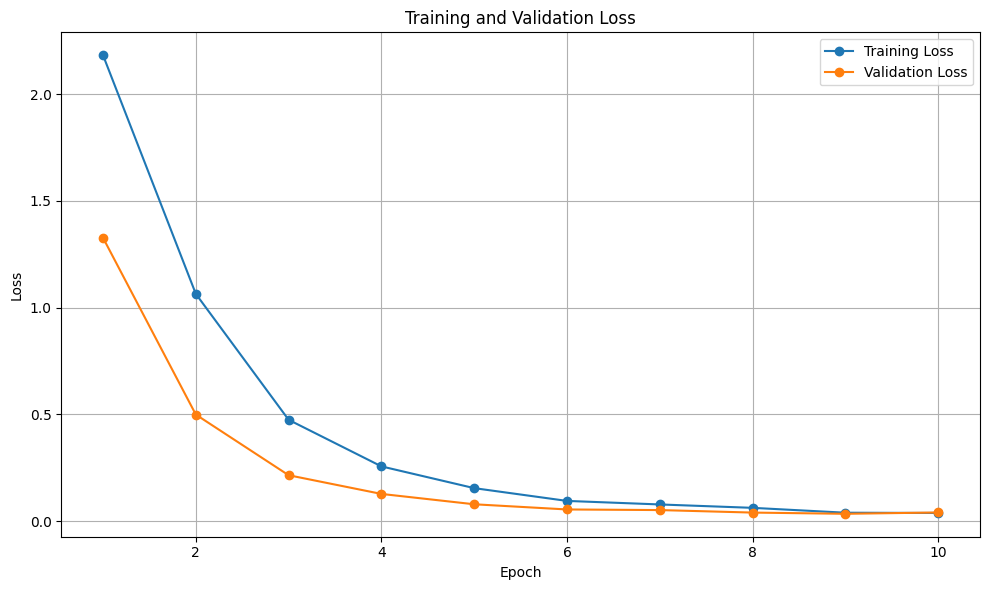

In [103]:
plt.figure(figsize=(10, 6))

plt.plot(
    epochs,
    train_losses,
    marker="o",
    label="Training Loss"
)

plt.plot(
    epochs,
    val_losses,
    marker="o",
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")

plt.legend()
plt.grid(True)

plt.tight_layout()

loss_curve_path = RESULTS_DIR / "loss_curve.png"

plt.savefig(
    loss_curve_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

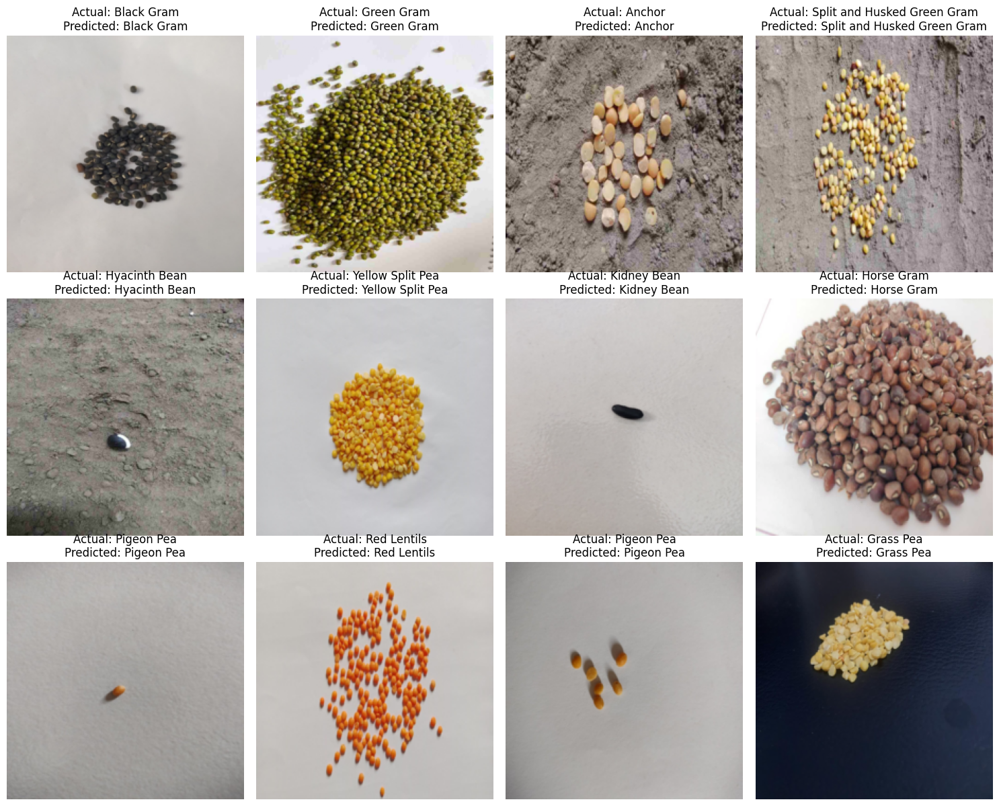

Saved sample predictions to: /content/drive/MyDrive/pulses-image-classification/results/sample_predictions.png


In [106]:
import random
import matplotlib.pyplot as plt
import torch

model.eval()

sample_indices = random.sample(
    range(len(test_dataset)),
    min(12, len(test_dataset))
)

plt.figure(figsize=(15, 12))

# Normalization values used during preprocessing
mean = torch.tensor(
    [0.485, 0.456, 0.406]
).view(3, 1, 1)

std = torch.tensor(
    [0.229, 0.224, 0.225]
).view(3, 1, 1)

for i, idx in enumerate(sample_indices):

    # Get image and actual label
    image, actual_label = test_dataset[idx]

    # Add batch dimension and move to device
    input_tensor = image.unsqueeze(0).to(device)

    # Prediction
    with torch.no_grad():
        output = model(input_tensor)

        predicted_label = torch.argmax(
            output,
            dim=1
        ).item()



    image_display = image.clone()

    image_display = image_display * std + mean

    # Keep values between 0 and 1
    image_display = torch.clamp(
        image_display,
        0,
        1
    )

    # Convert CHW -> HWC
    image_display = image_display.permute(
        1, 2, 0
    ).numpy()


    actual_class = idx_to_class[actual_label]

    predicted_class = idx_to_class[predicted_label]


    plt.subplot(3, 4, i + 1)

    plt.imshow(image_display)

    plt.title(
        f"Actual: {actual_class}\n"
        f"Predicted: {predicted_class}"
    )

    plt.axis("off")

plt.tight_layout()

# Save results
sample_path = RESULTS_DIR / "sample_predictions.png"

plt.savefig(
    sample_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"Saved sample predictions to: {sample_path}")

In [107]:
from PIL import Image
import torch
import torch.nn.functional as F


def predict_image(image_path):

    model.eval()

    image = Image.open(image_path).convert("RGB")

    input_tensor = test_transform(image)
    input_tensor = input_tensor.unsqueeze(0).to(device)

    with torch.no_grad():

        output = model(input_tensor)

        probabilities = F.softmax(
            output,
            dim=1
        )

        confidence, predicted_index = torch.max(
            probabilities,
            dim=1
        )

    predicted_index = predicted_index.item()
    confidence = confidence.item()

    predicted_class = idx_to_class[predicted_index]

    return predicted_class, confidence

In [108]:
test_image_path = test_df.iloc[0]["image_path"]

print("Testing image:")
print(test_image_path)

predict_image(test_image_path)

Testing image:
/content/pulses_dataset/An Image Dataset of Seven Major Pulses Grown in Ba/Pulses/Grass Pea/grass_pea_147.jpg


('Grass Pea', 0.99811851978302)

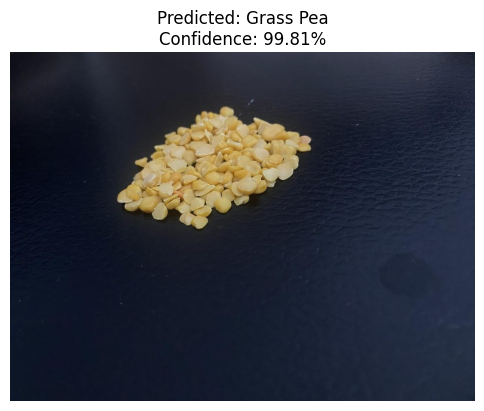

In [109]:
import matplotlib.pyplot as plt

test_image_path = test_df.iloc[0]["image_path"]

predicted_class, confidence = predict_image(
    test_image_path
)

image = Image.open(test_image_path).convert("RGB")

plt.figure(figsize=(6, 6))

plt.imshow(image)

plt.title(
    f"Predicted: {predicted_class}\n"
    f"Confidence: {confidence * 100:.2f}%"
)

plt.axis("off")
plt.show()

In [111]:
from google.colab import files

uploaded = files.upload()

Saving masoor.jpeg to masoor.jpeg


In [112]:
uploaded_filename = list(uploaded.keys())[0]

print("Uploaded:", uploaded_filename)

predict_image(uploaded_filename)

Uploaded: masoor.jpeg


('Unpolished Chickpea', 0.633433997631073)

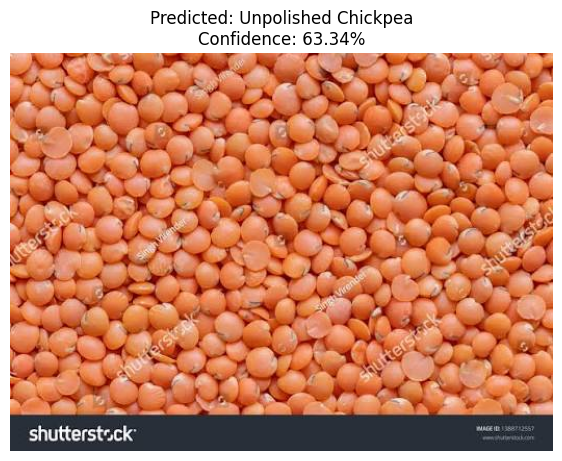

In [113]:
image = Image.open(uploaded_filename).convert("RGB")

predicted_class, confidence = predict_image(
    uploaded_filename
)

plt.figure(figsize=(7, 7))

plt.imshow(image)

plt.title(
    f"Predicted: {predicted_class}\n"
    f"Confidence: {confidence * 100:.2f}%"
)

plt.axis("off")
plt.show()

In [114]:
def predict_top3(image_path):

    image = Image.open(image_path).convert("RGB")

    input_tensor = test_transform(image)

    input_tensor = input_tensor.unsqueeze(0).to(device)

    with torch.no_grad():

        output = model(input_tensor)

        probabilities = F.softmax(output, dim=1)

        top_probabilities, top_indices = torch.topk(
            probabilities,
            k=3,
            dim=1
        )

    print("Top 3 predictions:")
    print("-" * 40)

    for probability, index in zip(
        top_probabilities[0],
        top_indices[0]
    ):

        class_name = idx_to_class[index.item()]

        print(
            f"{class_name:<35} "
            f"{probability.item() * 100:.2f}%"
        )

In [115]:
predict_top3(uploaded_filename)

Top 3 predictions:
----------------------------------------
Unpolished Chickpea                 63.34%
Red Lentils                         8.16%
Pigeon Pea                          6.63%


In [116]:
red_lentil_df = test_df[
    test_df["class_name"] == "Red Lentils"
]

print("Red Lentils test images:", len(red_lentil_df))

display(red_lentil_df.head())

Red Lentils test images: 29


,image_path,class_name,label
2005,/content/pulses_dataset/An Image Dataset of Se...,Red Lentils,9
1945,/content/pulses_dataset/An Image Dataset of Se...,Red Lentils,9
1974,/content/pulses_dataset/An Image Dataset of Se...,Red Lentils,9
2044,/content/pulses_dataset/An Image Dataset of Se...,Red Lentils,9
2104,/content/pulses_dataset/An Image Dataset of Se...,Red Lentils,9


In [117]:
for i in range(min(10, len(red_lentil_df))):

    image_path = red_lentil_df.iloc[i]["image_path"]

    predicted_class, confidence = predict_image(
        image_path
    )

    actual_class = red_lentil_df.iloc[i]["class_name"]

    print(
        f"Actual: {actual_class:20s} "
        f"Predicted: {predicted_class:30s} "
        f"Confidence: {confidence * 100:.2f}%"
    )

Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.69%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 98.59%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.51%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.45%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.22%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.33%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.06%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.59%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 99.78%
Actual: Red Lentils          Predicted: Red Lentils                    Confidence: 98.77%


In [118]:
def predict_all_classes(image_path):

    image = Image.open(image_path).convert("RGB")

    input_tensor = test_transform(image)
    input_tensor = input_tensor.unsqueeze(0).to(device)

    model.eval()

    with torch.no_grad():

        output = model(input_tensor)

        probabilities = F.softmax(
            output,
            dim=1
        )[0]

    results = []

    for index, probability in enumerate(probabilities):

        results.append({
            "Class": idx_to_class[index],
            "Probability": probability.item()
        })

    results = sorted(
        results,
        key=lambda x: x["Probability"],
        reverse=True
    )

    return results

In [119]:
results = predict_all_classes(
    uploaded_filename
)

for result in results:
    print(
        f"{result['Class']:<35} "
        f"{result['Probability'] * 100:.2f}%"
    )

Unpolished Chickpea                 63.34%
Red Lentils                         8.16%
Pigeon Pea                          6.63%
Unpolished Grass Pea                5.72%
Grass Pea                           4.31%
Horse Gram                          2.71%
White Pea                           1.76%
Yellow Split Pea                    1.71%
Anchor                              1.54%
Polished Chickpea                   1.22%
Split Black Gram                    0.97%
Kidney Bean                         0.51%
Hyacinth Bean                       0.49%
Split and Husked Green Gram         0.45%
Green Gram                          0.25%
Black Gram                          0.23%


In [120]:
red_lentil_df = test_df[
    test_df["class_name"] == "Red Lentils"
]

print("Red Lentils test images:", len(red_lentil_df))

Red Lentils test images: 29


In [121]:
for i in range(min(10, len(red_lentil_df))):

    image_path = red_lentil_df.iloc[i]["image_path"]

    predicted_class, confidence = predict_image(
        image_path
    )

    print(
        "Actual:",
        "Red Lentils",
        "| Predicted:",
        predicted_class,
        "| Confidence:",
        f"{confidence * 100:.2f}%"
    )

Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.69%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 98.59%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.51%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.45%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.22%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.33%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.06%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.59%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 99.78%
Actual: Red Lentils | Predicted: Red Lentils | Confidence: 98.77%


In [122]:
results = predict_all_classes(
    uploaded_filename
)

for result in results[:5]:
    print(
        f"{result['Class']:<35}"
        f"{result['Probability'] * 100:.2f}%"
    )

Unpolished Chickpea                63.34%
Red Lentils                        8.16%
Pigeon Pea                         6.63%
Unpolished Grass Pea               5.72%
Grass Pea                          4.31%


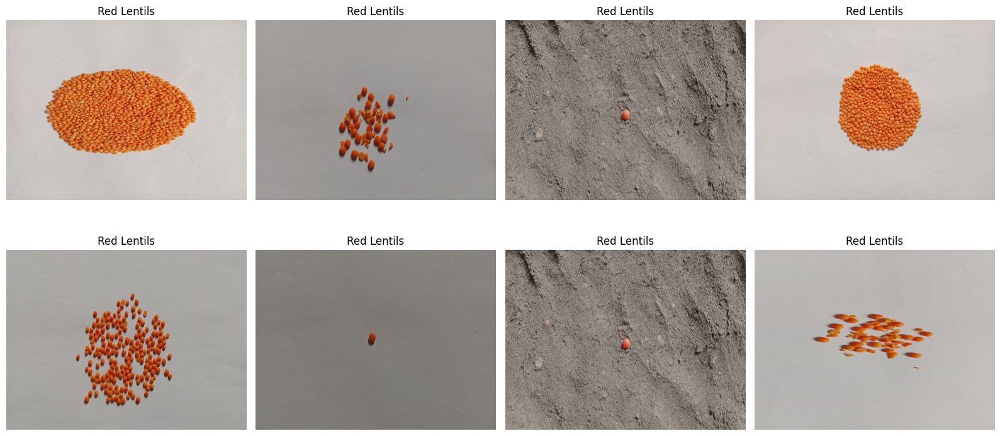

In [123]:
import matplotlib.pyplot as plt
from PIL import Image

red_samples = train_df[
    train_df["class_name"] == "Red Lentils"
].sample(8, random_state=42)

plt.figure(figsize=(16, 8))

for i, (_, row) in enumerate(red_samples.iterrows()):

    image = Image.open(
        row["image_path"]
    ).convert("RGB")

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title("Red Lentils")
    plt.axis("off")

plt.tight_layout()
plt.show()

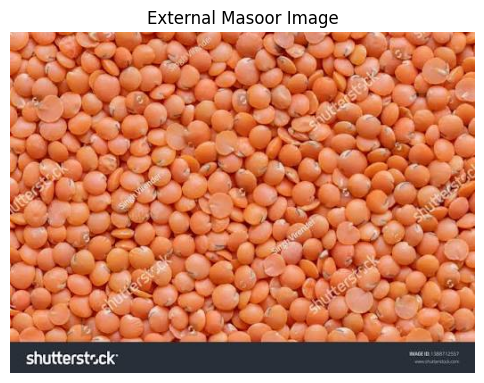

In [124]:
image = Image.open(uploaded_filename).convert("RGB")

plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title("External Masoor Image")
plt.axis("off")
plt.show()

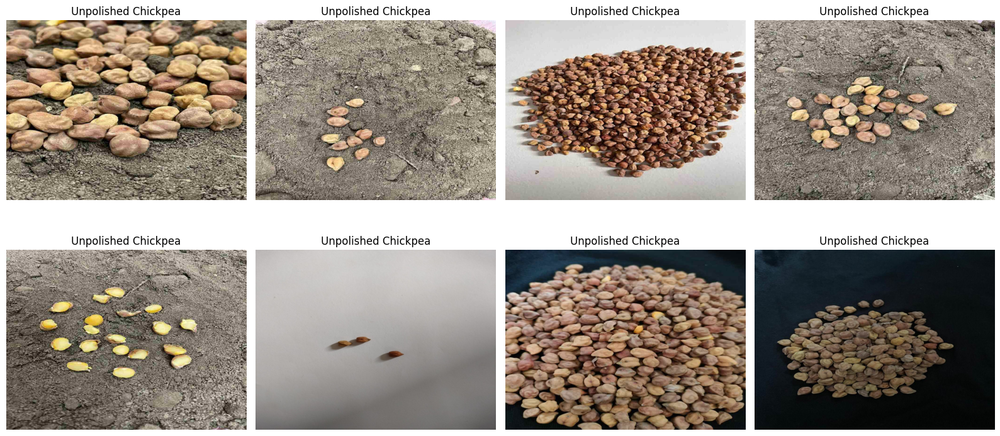

In [125]:
chickpea_samples = train_df[
    train_df["class_name"] == "Unpolished Chickpea"
].sample(8, random_state=42)

plt.figure(figsize=(16, 8))

for i, (_, row) in enumerate(chickpea_samples.iterrows()):

    image = Image.open(
        row["image_path"]
    ).convert("RGB")

    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title("Unpolished Chickpea")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [126]:
from pathlib import Path

PROJECT_DIR = Path(
    "/content/drive/MyDrive/pulses-image-classification"
)

# Create project directories
for folder in [
    "notebooks",
    "src",
    "results",
    "models"
]:
    (PROJECT_DIR / folder).mkdir(
        parents=True,
        exist_ok=True
    )

print("Project structure created.")

for path in sorted(PROJECT_DIR.iterdir()):
    print(path.name)

Project structure created.
data
models
notebooks
results
src


In [127]:
from pathlib import Path

PROJECT_DIR = Path(
    "/content/drive/MyDrive/pulses-image-classification"
)

requirements = """torch
torchvision
pandas
numpy
scikit-learn
matplotlib
seaborn
Pillow
"""

requirements_path = PROJECT_DIR / "requirements.txt"

requirements_path.write_text(requirements)

print("Created:", requirements_path)

Created: /content/drive/MyDrive/pulses-image-classification/requirements.txt


In [128]:
print(requirements_path.read_text())

torch
torchvision
pandas
numpy
scikit-learn
matplotlib
seaborn
Pillow



In [141]:
gitignore = """# Dataset
data/
*.zip

# Raw images
*.jpg
*.jpeg
*.bmp
*.webp

# Python
__pycache__/
*.py[cod]
.ipynb_checkpoints/

# Virtual environments
venv/
.env

# Model checkpoints
*.pth
*.pt

# Colab
*.ipynb_checkpoints

# Keep project results
!results/
!results/*.png
"""

(PROJECT_DIR / ".gitignore").write_text(
    gitignore,
    encoding="utf-8"
)

print(".gitignore updated.")

.gitignore updated.


In [130]:
print("Accuracy :", f"{accuracy * 100:.2f}%")
print("Precision:", f"{precision * 100:.2f}%")
print("Recall   :", f"{recall * 100:.2f}%")
print("F1-score :", f"{f1 * 100:.2f}%")
print("Best Val :", f"{best_val_accuracy * 100:.2f}%")

Accuracy : 98.42%
Precision: 98.54%
Recall   : 98.42%
F1-score : 98.43%
Best Val : 99.10%


In [144]:
readme = """
# Pulses Image Classification

A deep learning-based image classification project for identifying
different types and varieties of pulses using transfer learning
with EfficientNet-B0.

---

## 1. Project Overview

This project develops an image classification model capable of
classifying pulse images into 16 different classes.

The project uses a publicly available pulse image dataset and
applies image preprocessing, data augmentation, transfer learning,
model training, validation and evaluation.

The final model is also tested on external images using an
inference pipeline.

---

## 2. Dataset

### Dataset Name

An Image Dataset of Seven Major Pulses Grown in Bangladesh

### Dataset Source

[DATASET URL WILL BE ADDED HERE]

### Dataset Description

The dataset contains images of different varieties and forms of
pulses. After inspecting and preparing the dataset, 2,956 valid
images were used for this classification task.

The dataset contains 16 classes.

### Classes

The classes used in this project are:

1. Anchor
2. Black Gram
3. Grass Pea
4. Green Gram
5. Horse Gram
6. Hyacinth Bean
7. Kidney Bean
8. Pigeon Pea
9. Polished Chickpea
10. Red Lentils
11. Split Black Gram
12. Split and Husked Green Gram
13. Unpolished Chickpea
14. Unpolished Grass Pea
15. White Pea
16. Yellow Split Pea

---

## 3. Dataset Statistics

Total images: 2,956

| Dataset Split | Number of Images |
|---|---:|
| Training | 2,069 |
| Validation | 443 |
| Testing | 444 |
| Total | 2,956 |

No corrupted images were found during dataset validation.

---

## 4. Data Preprocessing

The following preprocessing steps were applied:

- Images were converted to RGB format.
- Images were resized to 224 × 224 pixels.
- Images were converted to PyTorch tensors.
- Images were normalized using ImageNet mean and standard deviation.

The ImageNet normalization values used were:

Mean:

    [0.485, 0.456, 0.406]

Standard deviation:

    [0.229, 0.224, 0.225]

---

## 5. Data Augmentation

Data augmentation was applied to the training images to improve
generalization and reduce overfitting.

The augmentation pipeline included transformations such as:

- Random horizontal flipping
- Random rotation
- Color variation

Validation and test images were not randomly augmented so that
their performance could be measured consistently.

---

## 6. Model Architecture

### EfficientNet-B0

EfficientNet-B0 was selected as the classification model.

The model uses ImageNet pretrained weights and transfer learning.

The original classification layer was replaced with a new fully
connected layer containing 16 output classes.

Conceptually:

Input Image
    ↓
Resize 224 × 224
    ↓
EfficientNet-B0 Backbone
    ↓
Feature Extraction
    ↓
Fully Connected Layer
    ↓
16 Class Outputs
    ↓
Predicted Pulse Class

---

## 7. Why Transfer Learning?

Instead of training the entire neural network from scratch, a model
pretrained on ImageNet was used.

The pretrained network has already learned useful visual features
such as:

- edges
- textures
- shapes
- patterns
- object structures

These features can be adapted to the pulse classification problem.

Transfer learning is especially useful when the available dataset
is relatively small.

---

## 8. Training Configuration

| Parameter | Value |
|---|---|
| Model | EfficientNet-B0 |
| Pretrained weights | ImageNet |
| Image size | 224 × 224 |
| Batch size | 32 |
| Optimizer | Adam |
| Learning rate | 0.0001 |
| Loss function | CrossEntropyLoss |
| Number of classes | 16 |
| Epochs | 10 |

---

## 9. Evaluation Metrics

The model was evaluated using:

### Accuracy

Measures the percentage of correctly classified images.

### Precision

Measures how many images predicted as a particular class actually
belong to that class.

### Recall

Measures how many images belonging to a particular class were
correctly identified.

### F1-score

Provides a balance between precision and recall.

Weighted averaging was used for the multiclass precision, recall
and F1-score calculations.

---

## 10. Results

| Metric | Score |
|---|---:|
| Best Validation Accuracy | 99.10% |
| Test Accuracy | 98.42% |
| Precision | 98.54% |
| Recall | 98.42% |
| F1-score | 98.43% |

The final values will be updated with the actual experimental
results.

---

## 11. Confusion Matrix

The confusion matrix shows the relationship between actual and
predicted classes.

The diagonal represents correctly classified images, while
off-diagonal values represent misclassifications.

![Confusion Matrix](results/confusion_matrix.png)

---

## 12. Training Curves

### Training and Validation Accuracy

![Accuracy Curve](results/accuracy_curve.png)

### Training and Validation Loss

![Loss Curve](results/loss_curve.png)

These curves are used to understand model learning behaviour and
identify potential overfitting or underfitting.

---

## 13. Sample Predictions

Example predictions generated by the trained model:

![Sample Predictions](results/sample_predictions.png)

The visualization compares the actual class with the predicted
class for randomly selected test images.

---

## 14. Inference on New Images

The trained model can be used to classify a new pulse image.

Example:

```python
predicted_class, confidence = predict_image(
    "path/to/new/image.jpg"
)"""

print("Predicted class:", predicted_class)
print("Confidence:", confidence)

Predicted class: Red Lentils
Confidence: 0.987682044506073


In [133]:
dataset_code = '''
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset


class PulsesDataset(Dataset):

    def __init__(self, dataframe, transform=None):

        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):

        return len(self.dataframe)

    def __getitem__(self, index):

        image_path = self.dataframe.loc[index, "image_path"]
        label = self.dataframe.loc[index, "label"]

        image = Image.open(image_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label
'''

(PROJECT_DIR / "src" / "dataset.py").write_text(
    dataset_code,
    encoding="utf-8"
)

print("dataset.py created")

dataset.py created


In [134]:
model_code = '''
import torch.nn as nn
from torchvision.models import (
    efficientnet_b0,
    EfficientNet_B0_Weights
)


def create_model(num_classes):

    weights = EfficientNet_B0_Weights.DEFAULT

    model = efficientnet_b0(
        weights=weights
    )

    num_features = model.classifier[1].in_features

    model.classifier[1] = nn.Linear(
        num_features,
        num_classes
    )

    return model
'''

(PROJECT_DIR / "src" / "model.py").write_text(
    model_code,
    encoding="utf-8"
)

print("model.py created")

model.py created


In [135]:
train_code = '''
import torch


def train_one_epoch(
    model,
    dataloader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in dataloader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += (
            loss.item() * images.size(0)
        )

        _, predictions = torch.max(
            outputs,
            1
        )

        total += labels.size(0)

        correct += (
            predictions == labels
        ).sum().item()

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy


def validate(
    model,
    dataloader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in dataloader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += (
                loss.item() * images.size(0)
            )

            _, predictions = torch.max(
                outputs,
                1
            )

            total += labels.size(0)

            correct += (
                predictions == labels
            ).sum().item()

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy
'''

(PROJECT_DIR / "src" / "train.py").write_text(
    train_code,
    encoding="utf-8"
)

print("train.py created")

train.py created


In [136]:
evaluate_code = '''
import torch
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)


def get_predictions(
    model,
    dataloader,
    device
):

    model.eval()

    all_predictions = []
    all_labels = []

    with torch.no_grad():

        for images, labels in dataloader:

            images = images.to(device)

            outputs = model(images)

            _, predictions = torch.max(
                outputs,
                1
            )

            all_predictions.extend(
                predictions.cpu().numpy()
            )

            all_labels.extend(
                labels.numpy()
            )

    return all_labels, all_predictions


def calculate_metrics(
    all_labels,
    all_predictions
):

    accuracy = accuracy_score(
        all_labels,
        all_predictions
    )

    precision = precision_score(
        all_labels,
        all_predictions,
        average="weighted",
        zero_division=0
    )

    recall = recall_score(
        all_labels,
        all_predictions,
        average="weighted",
        zero_division=0
    )

    f1 = f1_score(
        all_labels,
        all_predictions,
        average="weighted",
        zero_division=0
    )

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1
    }


def create_confusion_matrix(
    all_labels,
    all_predictions
):

    return confusion_matrix(
        all_labels,
        all_predictions
    )


def classification_report_text(
    all_labels,
    all_predictions,
    classes
):

    return classification_report(
        all_labels,
        all_predictions,
        target_names=classes,
        zero_division=0
    )
'''

(PROJECT_DIR / "src" / "evaluate.py").write_text(
    evaluate_code,
    encoding="utf-8"
)

print("evaluate.py created")

evaluate.py created


In [137]:
predict_code = '''
from PIL import Image
import torch
import torch.nn.functional as F


def predict_image(
    image_path,
    model,
    transform,
    idx_to_class,
    device
):

    model.eval()

    image = Image.open(
        image_path
    ).convert("RGB")

    input_tensor = transform(image)

    input_tensor = (
        input_tensor
        .unsqueeze(0)
        .to(device)
    )

    with torch.no_grad():

        output = model(
            input_tensor
        )

        probabilities = F.softmax(
            output,
            dim=1
        )

        confidence, predicted_index = (
            torch.max(
                probabilities,
                dim=1
            )
        )

    predicted_index = (
        predicted_index.item()
    )

    confidence = confidence.item()

    predicted_class = (
        idx_to_class[predicted_index]
    )

    return predicted_class, confidence
'''

(PROJECT_DIR / "src" / "predict.py").write_text(
    predict_code,
    encoding="utf-8"
)

print("predict.py created")

predict.py created


In [138]:
src_dir = PROJECT_DIR / "src"

print("Source files:")
for file in sorted(src_dir.iterdir()):
    print("📄", file.name)

Source files:
📄 dataset.py
📄 evaluate.py
📄 model.py
📄 predict.py
📄 train.py


In [139]:
(PROJECT_DIR / "src" / "__init__.py").write_text(
    "",
    encoding="utf-8"
)

print("__init__.py created")

__init__.py created


In [142]:
def show_tree(path, prefix=""):
    path = Path(path)

    items = sorted(
        path.iterdir(),
        key=lambda x: (not x.is_dir(), x.name)
    )

    for i, item in enumerate(items):

        connector = "└── " if i == len(items)-1 else "├── "

        print(prefix + connector + item.name)

        if item.is_dir():

            extension = "    " if i == len(items)-1 else "│   "

            show_tree(
                item,
                prefix + extension
            )


show_tree(PROJECT_DIR)

├── data
├── models
│   └── best_model.pth
├── notebooks
├── results
│   ├── accuracy_curve.png
│   ├── confusion_matrix.png
│   ├── loss_curve.png
│   └── sample_predictions.png
├── src
│   ├── __init__.py
│   ├── dataset.py
│   ├── evaluate.py
│   ├── model.py
│   ├── predict.py
│   └── train.py
├── .gitignore
└── requirements.txt


In [145]:
print("README exists:", (PROJECT_DIR / "README.md").exists())

README exists: False


In [146]:
notebook_dir = PROJECT_DIR / "notebooks"

print("Notebook files:")

for item in notebook_dir.iterdir():
    print(item.name)

Notebook files:


In [147]:
import os

print("Searching for notebook files...\n")

for root, dirs, files in os.walk("/content"):
    for file in files:
        if file.endswith(".ipynb"):
            print(os.path.join(root, file))

Searching for notebook files...

/content/drive/MyDrive/Colab Notebooks/Pulses_Image_Classification.ipynb


In [148]:
import shutil
from pathlib import Path

source_notebook = Path(
    "/content/drive/MyDrive/Colab Notebooks/Pulses_Image_Classification.ipynb"
)

destination_notebook = (
    PROJECT_DIR
    / "notebooks"
    / "Pulses_Image_Classification.ipynb"
)

shutil.copy2(
    source_notebook,
    destination_notebook
)

print("Notebook copied successfully!")
print("Destination:", destination_notebook)

Notebook copied successfully!
Destination: /content/drive/MyDrive/pulses-image-classification/notebooks/Pulses_Image_Classification.ipynb


In [149]:
notebook_dir = PROJECT_DIR / "notebooks"

print("Notebook files:")

for item in notebook_dir.iterdir():
    print("📄", item.name)

Notebook files:
📄 Pulses_Image_Classification.ipynb


In [151]:
def show_tree(path, prefix=""):
    path = Path(path)

    items = sorted(
        path.iterdir(),
        key=lambda x: (not x.is_dir(), x.name)
    )

    for i, item in enumerate(items):
        connector = "└── " if i == len(items) - 1 else "├── "
        print(prefix + connector + item.name)

        if item.is_dir():
            extension = "    " if i == len(items) - 1 else "│   "
            show_tree(item, prefix + extension)


show_tree(PROJECT_DIR)

├── data
├── models
│   └── best_model.pth
├── notebooks
│   └── Pulses_Image_Classification.ipynb
├── results
│   ├── accuracy_curve.png
│   ├── confusion_matrix.png
│   ├── loss_curve.png
│   └── sample_predictions.png
├── src
│   ├── __init__.py
│   ├── dataset.py
│   ├── evaluate.py
│   ├── model.py
│   ├── predict.py
│   └── train.py
├── .gitignore
└── requirements.txt


In [152]:
%cd /content/drive/MyDrive/pulses-image-classification

/content/drive/MyDrive/pulses-image-classification


In [153]:
!git init

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
Initialized empty Git repository in /content/drive/MyDrive/pulses-image-classification/.git/


In [154]:
!git status

On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.gitignore
	notebooks/
	requirements.txt
	results/
	src/

nothing added to commit but untracked files present (use "git add" to track)


In [155]:
from pathlib import Path

readme_path = PROJECT_DIR / "README.md"

print("README exists:", readme_path.exists())

if readme_path.exists():
    print("README size:", readme_path.stat().st_size, "bytes")

README exists: False


In [156]:
from pathlib import Path

PROJECT_DIR = Path(
    "/content/drive/MyDrive/pulses-image-classification"
)

readme_path = PROJECT_DIR / "README.md"

readme_path.write_text(
    readme,
    encoding="utf-8"
)

print("README created successfully!")
print("Path:", readme_path)
print("Size:", readme_path.stat().st_size, "bytes")

README created successfully!
Path: /content/drive/MyDrive/pulses-image-classification/README.md
Size: 5309 bytes


In [157]:
print("README exists:", (PROJECT_DIR / "README.md").exists())

README exists: True


In [158]:
print(
    (PROJECT_DIR / "README.md").read_text(
        encoding="utf-8"
    )[:1000]
)


# Pulses Image Classification

A deep learning-based image classification project for identifying
different types and varieties of pulses using transfer learning
with EfficientNet-B0.

---

## 1. Project Overview

This project develops an image classification model capable of
classifying pulse images into 16 different classes.

The project uses a publicly available pulse image dataset and
applies image preprocessing, data augmentation, transfer learning,
model training, validation and evaluation.

The final model is also tested on external images using an
inference pipeline.

---

## 2. Dataset

### Dataset Name

An Image Dataset of Seven Major Pulses Grown in Bangladesh

### Dataset Source

[DATASET URL WILL BE ADDED HERE]

### Dataset Description

The dataset contains images of different varieties and forms of
pulses. After inspecting and preparing the dataset, 2,956 valid
images were used for this classification task.

The dataset contains 16 classes.

### Classes

The classes used

In [159]:
%cd /content/drive/MyDrive/pulses-image-classification
!git status

/content/drive/MyDrive/pulses-image-classification
On branch master

No commits yet

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	.gitignore
	README.md
	notebooks/
	requirements.txt
	results/
	src/

nothing added to commit but untracked files present (use "git add" to track)


In [160]:
!git add .

In [161]:
!git status

On branch master

No commits yet

Changes to be committed:
  (use "git rm --cached <file>..." to unstage)
	new file:   .gitignore
	new file:   README.md
	new file:   notebooks/Pulses_Image_Classification.ipynb
	new file:   requirements.txt
	new file:   results/accuracy_curve.png
	new file:   results/confusion_matrix.png
	new file:   results/loss_curve.png
	new file:   results/sample_predictions.png
	new file:   src/__init__.py
	new file:   src/dataset.py
	new file:   src/evaluate.py
	new file:   src/model.py
	new file:   src/predict.py
	new file:   src/train.py



In [162]:
!git config --global user.name "Manish Kumar"
!git config --global user.email "manishkumarraj482@gmail.com"

In [163]:
!git config --global user.name
!git config --global user.email

Manish Kumar
manishkumarraj482@gmail.com


In [164]:
!git commit -m "Initial pulses image classification project"

[master (root-commit) c8e7913] Initial pulses image classification project
 14 files changed, 631 insertions(+)
 create mode 100644 .gitignore
 create mode 100644 README.md
 create mode 100644 notebooks/Pulses_Image_Classification.ipynb
 create mode 100644 requirements.txt
 create mode 100644 results/accuracy_curve.png
 create mode 100644 results/confusion_matrix.png
 create mode 100644 results/loss_curve.png
 create mode 100644 results/sample_predictions.png
 create mode 100644 src/__init__.py
 create mode 100644 src/dataset.py
 create mode 100644 src/evaluate.py
 create mode 100644 src/model.py
 create mode 100644 src/predict.py
 create mode 100644 src/train.py


In [165]:
!git add .
!git status

On branch master
nothing to commit, working tree clean


In [166]:
%cd /content/drive/MyDrive/pulses-image-classification

/content/drive/MyDrive/pulses-image-classification


In [167]:
!git remote add origin https://github.com/Manish2585/pulses-image-classification.git

In [168]:
!git remote -v

origin	https://github.com/Manish2585/pulses-image-classification.git (fetch)
origin	https://github.com/Manish2585/pulses-image-classification.git (push)


In [169]:
!git branch -M main

In [170]:
!git branch

* main


In [171]:
!git push -u origin main

fatal: could not read Username for 'https://github.com': No such device or address


In [172]:
%cd /content/drive/MyDrive/pulses-image-classification

!git remote -v

/content/drive/MyDrive/pulses-image-classification
origin	https://github.com/Manish2585/pulses-image-classification.git (fetch)
origin	https://github.com/Manish2585/pulses-image-classification.git (push)


In [173]:
!gh --version

gh version 2.97.0 (2026-07-31)
https://github.com/cli/cli/releases/tag/v2.97.0


In [ ]:
import getpass

github_token = getpass.getpass("Paste GitHub token here: ")
print("Token received.")
